In [1]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import copy
import tqdm
import spatialcell as cs

In [2]:
adata_sc = sc.read_h5ad("results_example/adata_sc.h5ad")

In [3]:
adatas_final = sc.read_h5ad('results_example/adatas_7.h5ad')
adatas_final

AnnData object with n_obs × n_vars = 37510 × 2475
    obs: 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden'
    var: 'gene_ids', 'feature_types', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [4]:
import pickle
with open('results_example/cells_final_7.pkl', 'rb') as file:
    cells_final = pickle.load(file)

In [5]:
import pickle
with open('results_example/so1.pkl', 'rb') as file:
    so = pickle.load(file)

In [6]:
cell_type_final = cs.return_celltype_plot(adatas_final, so)

100%|██████████| 23340/23340 [01:04<00:00, 362.58it/s]


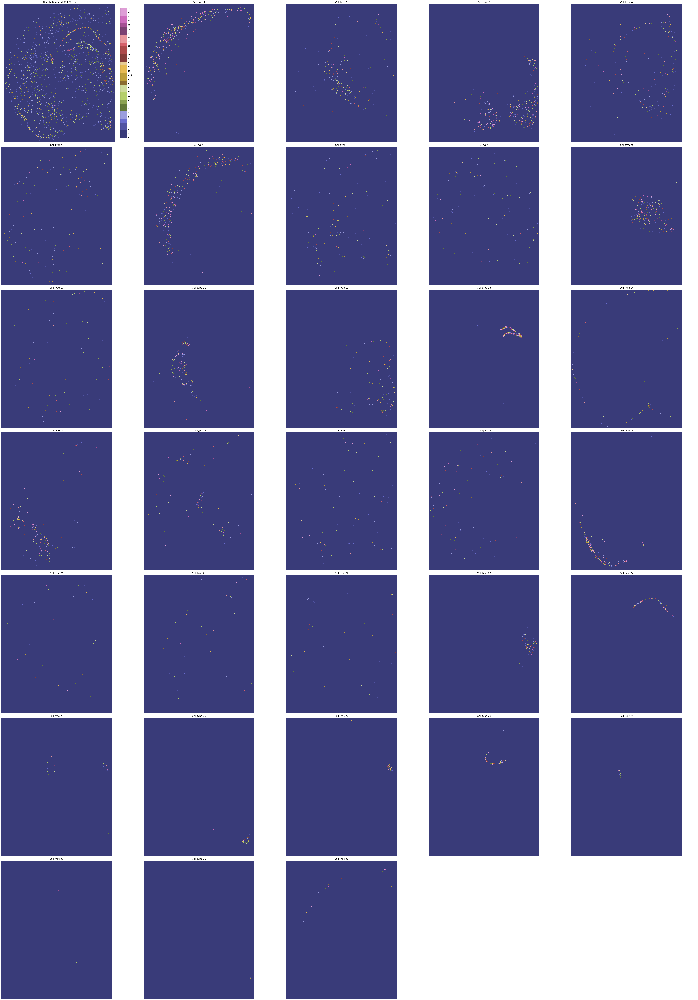

In [7]:
cs.plot_celltype_position(cell_type_final, col_num=5)

100%|██████████| 32/32 [04:18<00:00,  8.07s/it]


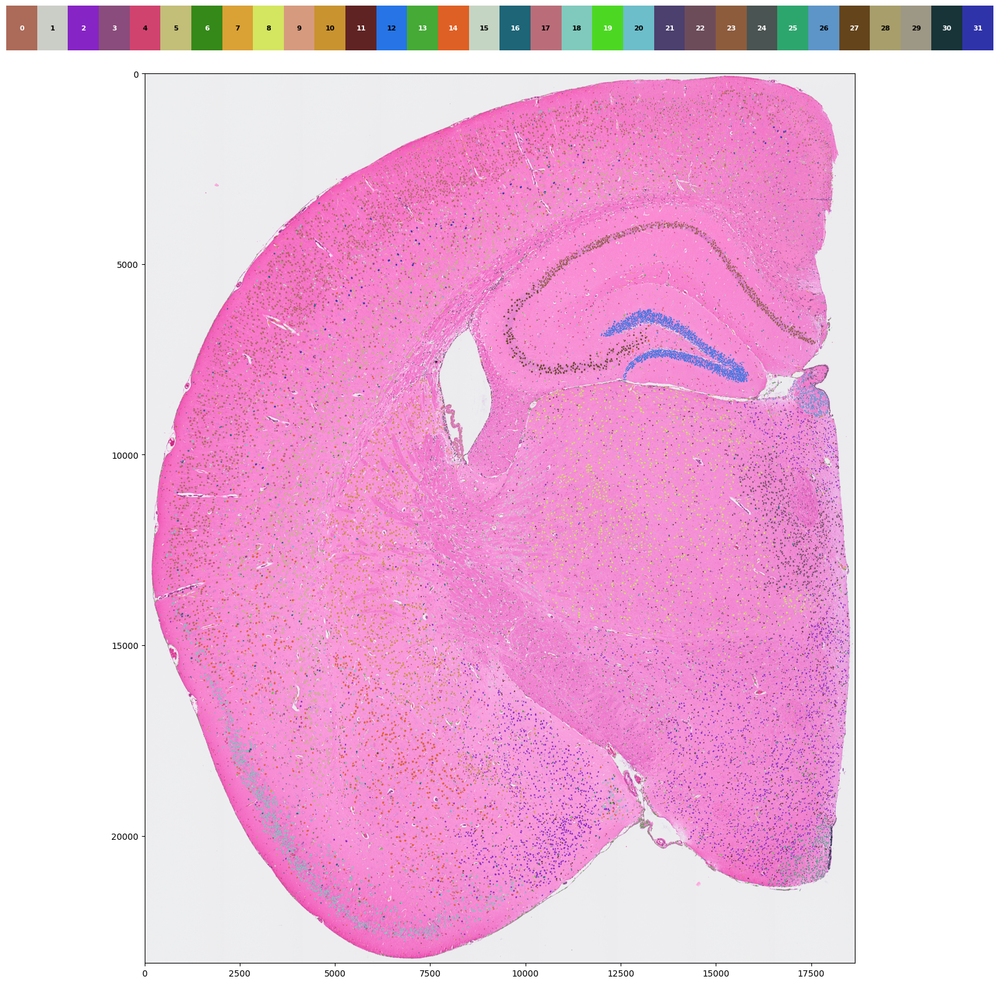

In [8]:
cs.plot_whole(so, cell_type_final,colors = None, save = 'results_example/result_whole_pic.pdf')

In [9]:
with open('results_example/weights_record.pkl', 'rb') as file:
    weights_record = pickle.load(file)

In [11]:
adata = sc.read_10x_mtx('../square_002um/filtered_feature_bc_matrix')
adata = copy.deepcopy(adata[so.df[so.df.in_tissue == 1]['barcode']])
sc.pp.filter_genes(adata, min_counts=1000) 

In [14]:
adata_sc_final = cs.get_finaldata_fast(cells_final, so, adatas_final, adata,weights_record[7])

 31%|███▏      | 421539/1343888 [00:23<00:36, 25103.57it/s]/home/juanru/miniconda3/envs/cellposesuidpy/lib/python3.9/site-packages/scipy/sparse/_base.py:699: RuntimeWarning: divide by zero encountered in divide
  return self.astype(np.float64)._mul_scalar(1./other)
  0%|          | 186/37611 [00:00<00:44, 843.32it/s]/home/juanru/Desktop/visuimhd_Data/mousebrain_new/spatialcell/spatialcell/split.py:519: RuntimeWarning: invalid value encountered in divide
  X = np.nan_to_num(np.rint((A/(A+B)).reshape(1, -1) *  np.array(data_temp[i[0]].todense())), nan=0.0, posinf=0.0, neginf=0.0)
100%|██████████| 37510/37510 [00:36<00:00, 1014.90it/s]


In [15]:
adata_sc_final 

AnnData object with n_obs × n_vars = 37510 × 9970
    obs: 'cell_type', 'cos_simularity'
    var: 'gene_ids', 'feature_types'

In [16]:
sc.pp.filter_cells(adata_sc_final, min_counts=10)
adata_sc_final

AnnData object with n_obs × n_vars = 37477 × 9970
    obs: 'cell_type', 'cos_simularity', 'n_counts'
    var: 'gene_ids', 'feature_types'

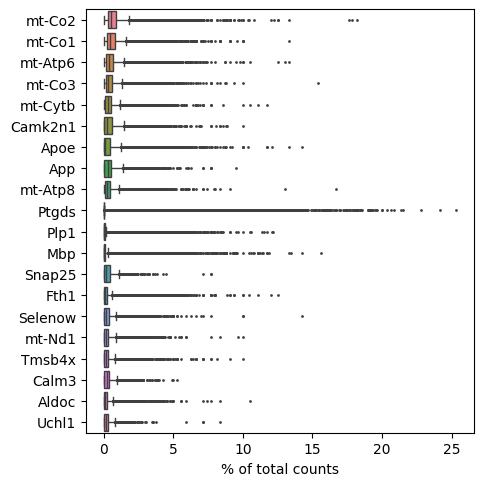

In [17]:
sc.pl.highest_expr_genes(adata_sc_final, n_top=20)

In [18]:
sc.pp.filter_cells(adata_sc_final, min_genes=20)
adata_sc_final

AnnData object with n_obs × n_vars = 37375 × 9970
    obs: 'cell_type', 'cos_simularity', 'n_counts', 'n_genes'
    var: 'gene_ids', 'feature_types'

In [19]:
# annotate the group of mitochondrial genes as "mt"
adata_sc_final.var["mt"] = adata_sc_final.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(
   adata_sc_final, qc_vars=["mt"], percent_top=None, log1p=False, inplace=True
)

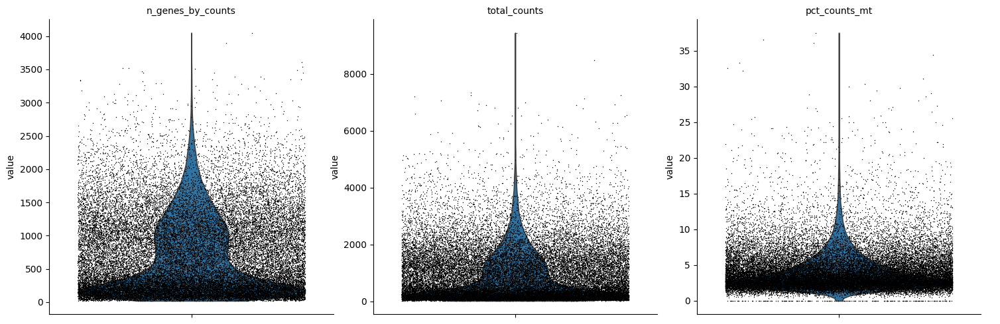

In [20]:
sc.pl.violin(
    adata_sc_final,
    ["n_genes_by_counts", "total_counts", "pct_counts_mt"],
    jitter=0.4,
    multi_panel=True,
)

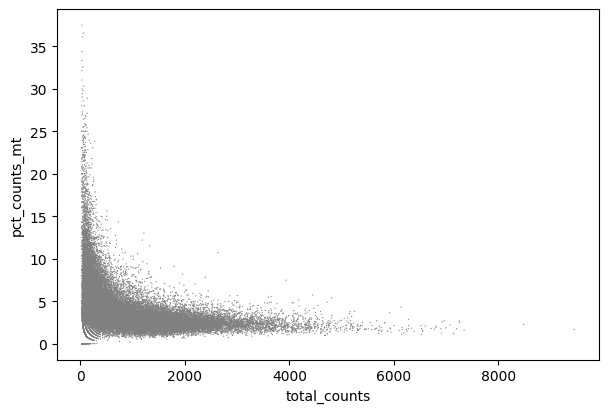

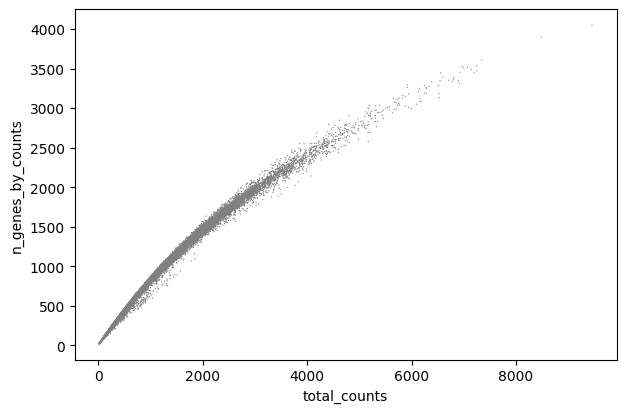

In [21]:
sc.pl.scatter(adata_sc_final, x="total_counts", y="pct_counts_mt")
sc.pl.scatter(adata_sc_final, x="total_counts", y="n_genes_by_counts")

In [22]:
adata_sc_final = adata_sc_final[adata_sc_final.obs.n_genes_by_counts < 4000, :]
adata_sc_final = adata_sc_final[adata_sc_final.obs.pct_counts_mt < 20, :].copy()

In [23]:
sc.pp.normalize_total(adata_sc_final , target_sum=1e4)

In [24]:
sc.pp.log1p(adata_sc_final)

In [25]:
sc.pp.highly_variable_genes(adata_sc_final, min_mean=0.0125, max_mean=3, min_disp=0.5)

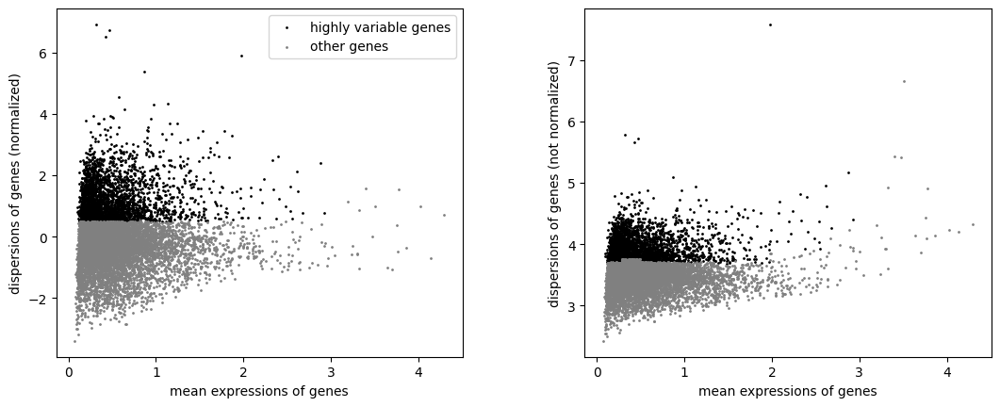

In [26]:
sc.pl.highly_variable_genes(adata_sc_final)

In [27]:
adata_sc_final.raw = adata_sc_final

In [28]:
adata_sc_final = adata_sc_final[:, adata_sc_final.var.highly_variable]

In [29]:
sc.pp.regress_out(adata_sc_final, ["total_counts", "pct_counts_mt"])

In [30]:
sc.pp.scale(adata_sc_final, max_value=10)

In [31]:
sc.tl.pca(adata_sc_final, svd_solver="arpack")

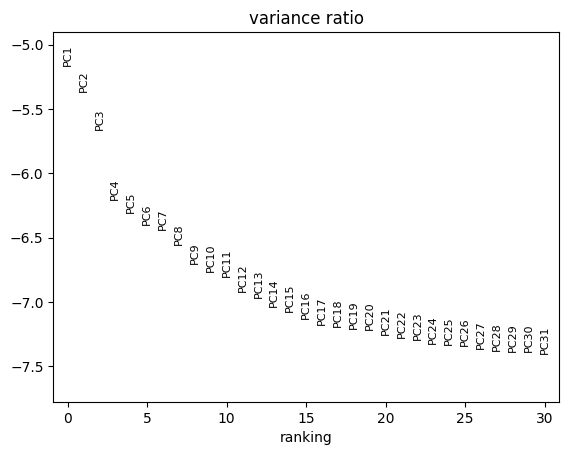

In [32]:
sc.pl.pca_variance_ratio(adata_sc_final, log=True)

In [33]:
sc.pp.neighbors(adata_sc_final, n_neighbors=10, n_pcs=40)

2024-06-03 18:05:10.106941: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-06-03 18:05:10.135981: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-06-03 18:05:10.136005: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-06-03 18:05:10.136902: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-06-03 18:05:10.142105: I tensorflow/core/platform/cpu_feature_guar

In [34]:
sc.tl.umap(adata_sc_final)

In [35]:
sc.tl.leiden(
    adata_sc_final,
    resolution=2,
    random_state=0,
    directed=False,
)

/home/juanru/miniconda3/envs/cellposesuidpy/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


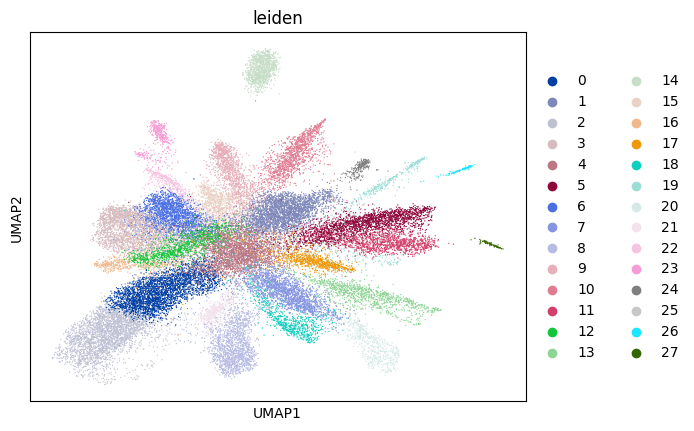

In [36]:
sc.pl.umap(adata_sc_final, color=["leiden"])

In [37]:
cell_type_final2 = cs.return_celltype_plot(adata_sc_final, so)

100%|██████████| 23340/23340 [01:04<00:00, 361.60it/s]


100%|██████████| 28/28 [03:20<00:00,  7.15s/it]


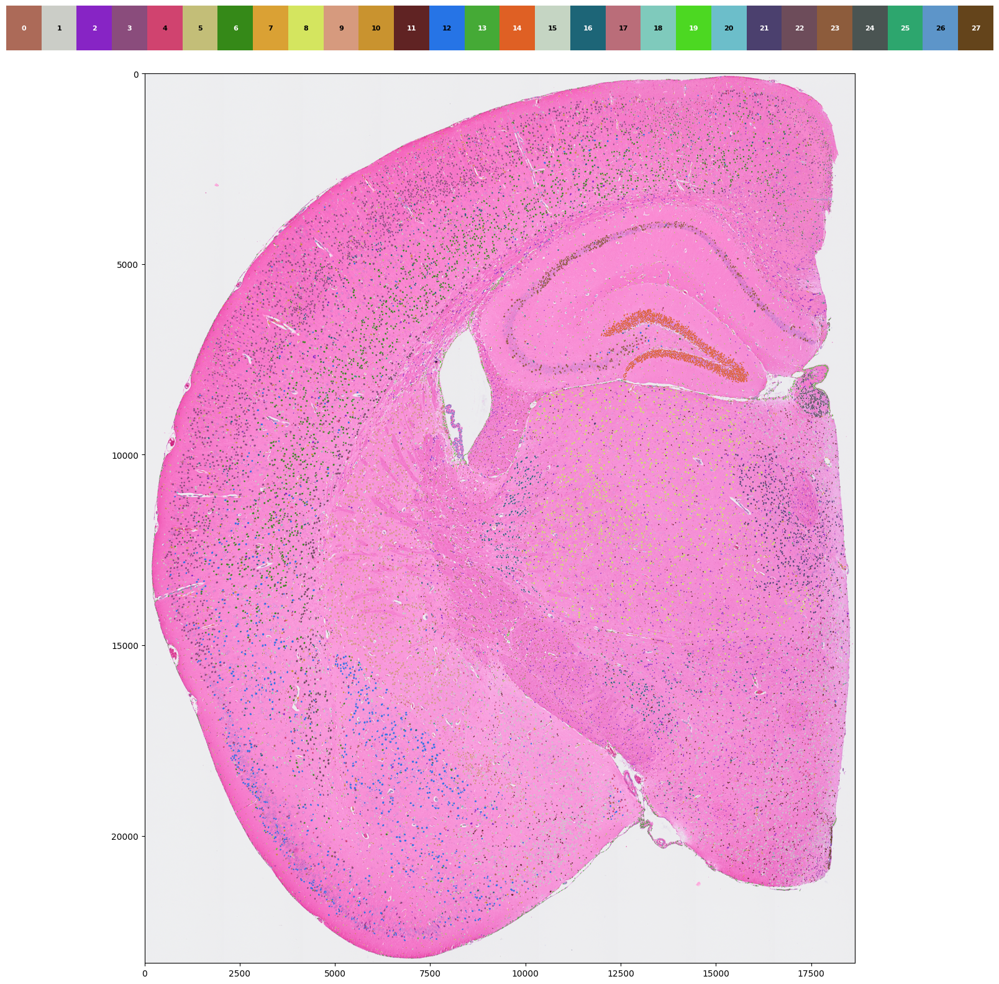

In [38]:
cs.plot_whole(so, cell_type_final2,colors = None, save = 'results_example/result_whole_pic2.pdf')